In [98]:
import pandas as pd
import numpy as np
import json
import re
from llms import gemini
from llms import chatGPT
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D  # for 3D plotting
import plotly.express as px
from sklearn.manifold import TSNE
from reportlab.pdfgen import canvas
from reportlab.lib.pagesizes import letter
from reportlab.lib.utils import ImageReader
import plotly.io as pio
import os
from os import getenv
from dotenv import load_dotenv
import requests
import ast

x_chat = chatGPT()
x_gemini = gemini()



load_dotenv("../.env",override=True)
GEO_KEY = getenv("geo_api_key")

df = pd.read_csv("../output/bls_df.csv",index_col=0)
tsne = pd.read_csv("../output/tsne.csv",index_col=0)
df = pd.concat([df,tsne],axis=1)

In [99]:
df.head()

,organization name,number,Example,example_task_embedding,founded date,website,description_all,industries_parsed,generated_description,parsed_description,...,Task,onet_task_embedding,onet_title_embedding,Task ID,example_task_embedding_tsne1,example_task_embedding_tsne2,onet_task_embedding_tsne1,onet_task_embedding_tsne2,onet_title_embedding_tsne1,onet_title_embedding_tsne2
0,Pika,1,A social media manager uses Pika to quickly ge...,"[-0.02056259848177433, 0.0018024604069069028, ...",2023-01-01,pika.art,Pika is a startup that develops an AI-powered ...,"['Generative AI', 'Graphic Design', 'Video']",Pika is an AI-powered platform that transforms...,"Tasks/Jobs: Video creation, Video editing, Ima...",...,"Set up and operate computer editing systems, e...","[-0.0002662857878021896, 0.028203614056110382,...","[0.007040147669613361, -0.003726074006408453, ...",4061,-2.907691,-16.831581,5.378636,-11.814865,-26.780743,15.921199
1,Pika,1,A social media manager uses Pika to quickly ge...,"[-0.02056259848177433, 0.0018024604069069028, ...",2023-01-01,pika.art,Pika is a startup that develops an AI-powered ...,"['Generative AI', 'Graphic Design', 'Video']",Pika is an AI-powered platform that transforms...,"Tasks/Jobs: Video creation, Video editing, Ima...",...,Program computerized graphic effects.,"[-0.002344447886571288, -0.0008995544048957527...","[0.007040147669613361, -0.003726074006408453, ...",4059,-3.768002,-17.111229,5.943604,-16.009360,-22.088655,16.933310
2,Sierra,1,A customer service representative uses Sierra'...,"[-0.010827294550836086, -0.031098157167434692,...",2023-01-01,sierra.ai,Sierra is an AI startup that tackles essential...,"['Enterprise Software', 'SaaS']",Sierra is an AI company that develops conversa...,"Tasks/Jobs: Customer service, Issue resolution...",...,Confer with customers by telephone or in perso...,"[-0.021733975037932396, -0.024151507765054703,...","[0.0009396936511620879, -0.036773744970560074,...",18565,-10.351049,20.163216,-19.127394,19.211212,-1.169030,31.804865
3,Essential AI,1,A marketing team uses Essential AI to generate...,"[0.002181823132559657, -0.020050395280122757, ...",2023-01-01,www.essential.ai,Essential AI creates AI solutions that enhance...,"['Information Technology', 'Software']",Essential AI develops and deploys AI solutions...,"Tasks/Jobs: Content generation, Data analysis,...",...,Write press releases or other media communicat...,"[-0.027300380170345306, -0.02108839713037014, ...","[0.014404620043933392, -0.027056021615862846, ...",20554,-3.156259,-8.872092,10.612223,-4.179881,22.744423,-2.878319
4,Essential AI,1,A marketing team uses Essential AI to generate...,"[0.002181823132559657, -0.020050395280122757, ...",2023-01-01,www.essential.ai,Essential AI creates AI solutions that enhance...,"['Information Technology', 'Software']",Essential AI develops and deploys AI solutions...,"Tasks/Jobs: Content generation, Data analysis,...",...,"Prepare or edit organizational publications, s...","[-0.00842389464378357, -0.02506590075790882, -...","[0.014404620043933392, -0.027056021615862846, ...",20557,-3.156259,-8.872092,9.029989,-5.884697,22.744423,-2.878319


In [100]:
# onet_occ = pd.read_csv("../input/onet/Occupation Data.csv")[["O*NET-SOC Code","Title"]]
# onet_occ.columns = ["Detailed Occupation","onet_title"]
# onet_occ["Detailed Occupation"] = onet_occ["Detailed Occupation"].apply(lambda x: x[:-3])
# all_tasks = all_tasks.merge(onet_occ, left_on="Title",right_on="onet_title").drop(columns=["Title"])

wage_employment = pd.read_csv("../input/wage_employment2022/national2022.csv")
wage_employment = wage_employment[wage_employment.O_GROUP == "detailed"]
wage_employment = wage_employment.rename({"OCC_CODE": "Detailed Occupation"}, axis=1)
wage_employment = wage_employment.replace("#", np.nan).replace("*", np.nan).replace({",": ""}, regex=True)
wage_employment[["H_MEDIAN", "A_MEDIAN","TOT_EMP","JOBS_1000"]] = wage_employment[["H_MEDIAN", "A_MEDIAN","TOT_EMP","JOBS_1000"]].astype("float")
wage_employment["H_MEDIAN"] = wage_employment["H_MEDIAN"].round(0)
wage_employment = wage_employment[["Detailed Occupation","H_MEDIAN","A_MEDIAN","TOT_EMP","JOBS_1000"]]
wage_employment.columns = ["Detailed Occupation","H_MEDIAN_US","A_MEDIAN_US","TOT_EMP_US","JOBS_1000_US"]


all_tasks = df.groupby("Task").aggregate({"onet_weight":"sum","Detailed Occupation":"first"}).reset_index()
task_statements = pd.read_csv("../input/onet/Task Statements.csv")[["Task","Title"]]
all_tasks = all_tasks.merge(task_statements, on=["Task"], how="outer")
all_tasks = all_tasks.replace(np.nan,0)
perc_of_10K = (wage_employment.groupby("Detailed Occupation")["TOT_EMP_US"].first()/df["TOT_EMP_US"].sum() * 10000).reset_index() # num of people for every 10K workers
perc_of_10K = perc_of_10K.rename({"TOT_EMP_US":"Percent of 10K workers","onet_title":"Title"},axis=1)


all_tasks = all_tasks.merge(perc_of_10K, on="Detailed Occupation")
ratios = all_tasks['onet_weight'] / all_tasks['Percent of 10K workers']
all_tasks["automated_weight"] = np.minimum(ratios, 1)


all_occupations = all_tasks.groupby("Detailed Occupation").aggregate({"automated_weight":"sum","Task":"count", "Title":"first"})
all_occupations.columns = ["occupation_# tasks automated","occupation_# of tasks","onet_title"]
all_occupations["occupation_onet_rating"] = all_occupations["occupation_# tasks automated"]/all_occupations["occupation_# of tasks"]
df = df.merge(all_tasks[["Task","automated_weight","Percent of 10K workers"]], on="Task")
df = df.merge(all_occupations,on=["Detailed Occupation","onet_title"])



all_occupations = all_occupations.merge(wage_employment, on="Detailed Occupation")
all_tasks = all_tasks.merge(wage_employment, on="Detailed Occupation")
all_tasks = all_tasks.rename({"Title":"onet_title"},axis=1)

In [101]:
def parse_bls(wage_employment,type):
    wage_employment = wage_employment[wage_employment.O_GROUP == "detailed"]
    wage_employment = wage_employment.rename({"OCC_CODE": "Detailed Occupation"}, axis=1)
    wage_employment = wage_employment.replace("#", np.nan).replace(r"\*+", np.nan, regex=True).replace(",", "", regex=True)
    wage_employment[["H_MEDIAN", "A_MEDIAN","TOT_EMP","JOBS_1000"]] = wage_employment[["H_MEDIAN", "A_MEDIAN","TOT_EMP", "JOBS_1000"]].astype("float")
    wage_employment["H_MEDIAN"] = wage_employment["H_MEDIAN"].round(0)
    wage_employment = wage_employment[["AREA","Detailed Occupation","H_MEDIAN","A_MEDIAN","TOT_EMP","JOBS_1000"]]
    wage_employment.columns = ["AREA","Detailed Occupation","H_MEDIAN_"+type,"A_MEDIAN_"+type,"TOT_EMP_"+type, 'JOBS_1000_'+type]
    return wage_employment


nonmetro = pd.read_csv("../input/wage_employment2022/non-metro.csv")
metro = pd.read_csv("../input/wage_employment2022/metro.csv")
nonmetro = parse_bls(nonmetro,"RURAL")
metro = parse_bls(metro,"METRO")


In [102]:
#figures out how much to weight each area
def calculate_weights(df,type):
    grouped = df.groupby("Detailed Occupation")["TOT_EMP_"+type].sum().reset_index()
    grouped = grouped.rename({"TOT_EMP_"+type: "sum_"+type}, axis=1)
    df = df.merge(grouped, on="Detailed Occupation")
    df["weight_area_"+type] = df["TOT_EMP_"+type] / df["sum_"+type]
    df["weighted_JOBS_1000_"+type] = df["JOBS_1000_"+type]*df["weight_area_"+type]
    return df
metro = calculate_weights(metro,"METRO")
nonmetro = calculate_weights(nonmetro,"RURAL")

In [103]:
metro

,AREA,Detailed Occupation,H_MEDIAN_METRO,A_MEDIAN_METRO,TOT_EMP_METRO,JOBS_1000_METRO,sum_METRO,weight_area_METRO,weighted_JOBS_1000_METRO
0,10180,11-1021,35.0,73120.0,2290.0,32.395,2863600.0,0.000800,0.025906
1,10380,11-1021,32.0,66790.0,360.0,7.195,2863600.0,0.000126,0.000905
2,10420,11-1021,46.0,95650.0,7970.0,25.447,2863600.0,0.002783,0.070824
3,10500,11-1021,36.0,74340.0,1190.0,20.233,2863600.0,0.000416,0.008408
4,10540,11-1021,38.0,77990.0,1120.0,23.803,2863600.0,0.000391,0.009310
...,...,...,...,...,...,...,...,...,...
139119,41700,53-7071,28.0,58870.0,30.0,0.030,150.0,0.200000,0.006000
139120,41620,51-7032,26.0,54330.0,30.0,0.038,30.0,1.000000,0.038000
139121,41980,17-2021,16.0,32440.0,30.0,0.051,30.0,1.000000,0.051000
139122,48540,47-5043,29.0,60250.0,130.0,2.238,130.0,1.000000,2.238000


In [85]:
metro_grouped = metro.groupby("Detailed Occupation").aggregate({"H_MEDIAN_METRO":"mean","TOT_EMP_METRO":"sum","A_MEDIAN_METRO":"mean", "weighted_JOBS_1000_METRO":"sum"},axis=1).reset_index()
nonmetro_grouped = nonmetro.groupby("Detailed Occupation").aggregate({"H_MEDIAN_RURAL":"mean","TOT_EMP_RURAL":"sum","A_MEDIAN_RURAL":"mean","weighted_JOBS_1000_RURAL":"sum"},axis=1).reset_index()



In [86]:
nonmetro_grouped.TOT_EMP_RURAL.sum() 

15176050.0

In [87]:
metro_grouped.TOT_EMP_METRO.sum() 

124472550.0

In [88]:
df = df.merge(metro_grouped,on="Detailed Occupation",how="left")
df = df.merge(nonmetro_grouped,on="Detailed Occupation",how="left")

In [89]:
df["weighted_JOBS_1000_diff"] = (df["weighted_JOBS_1000_METRO"]-df["weighted_JOBS_1000_RURAL"])/df["weighted_JOBS_1000_METRO"]*100

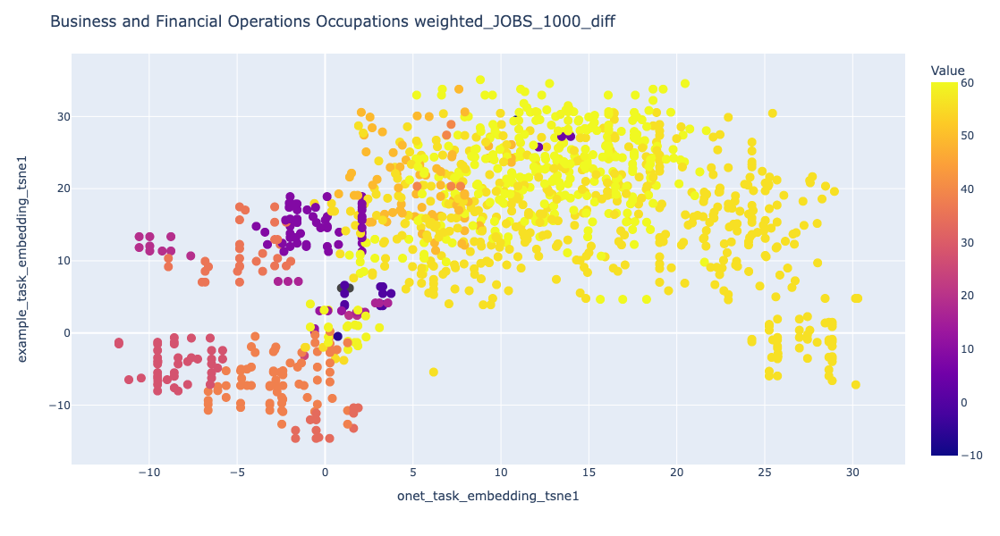

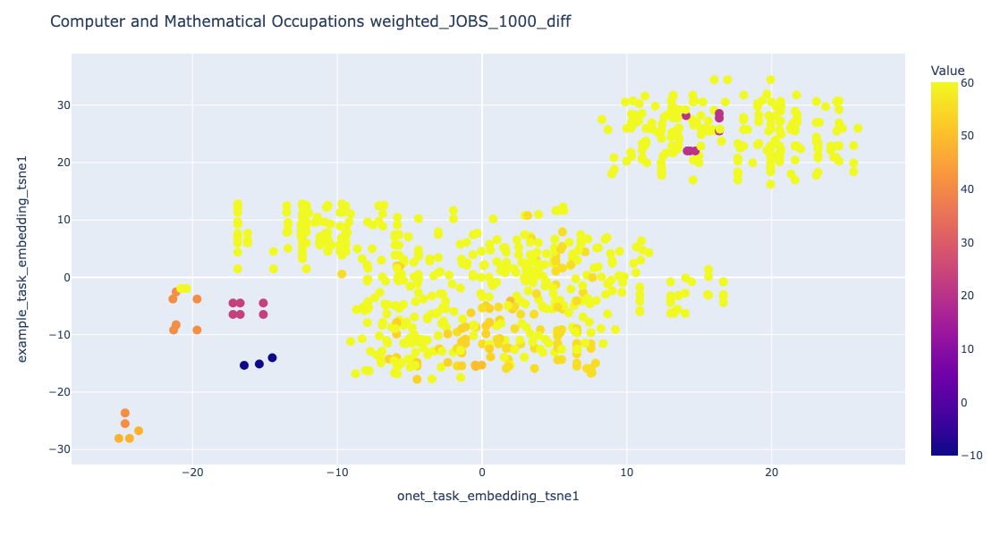

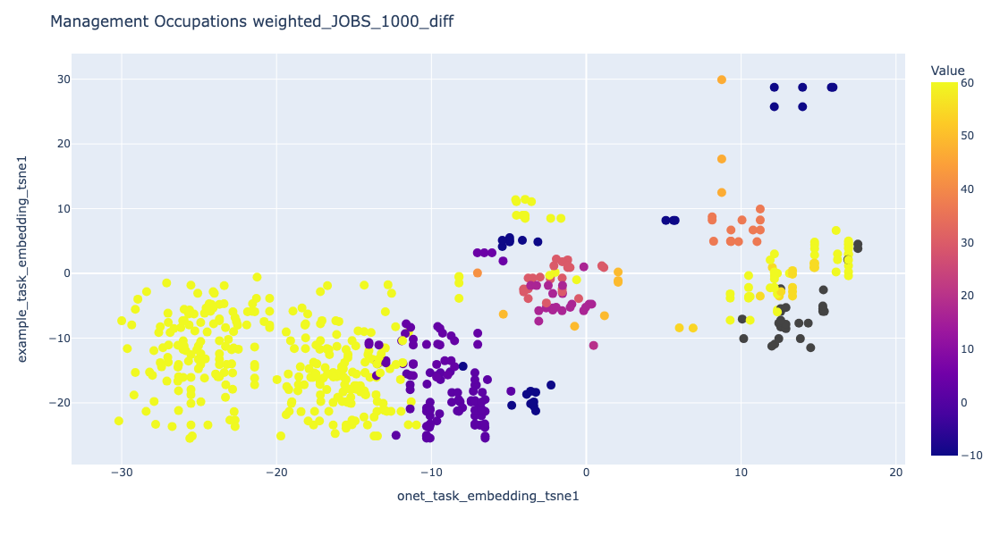

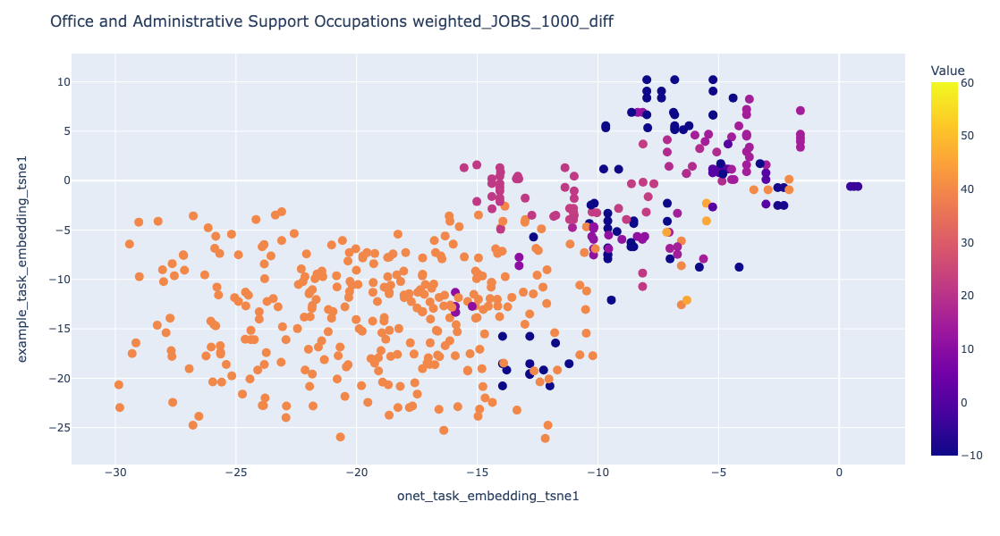

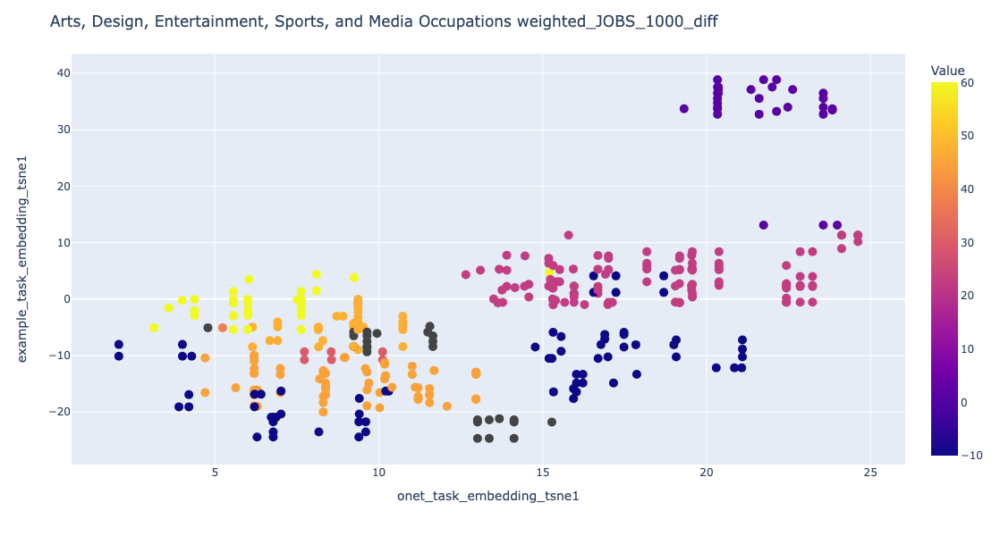

In [90]:
occ_type = "Major Group Name"
occ_groups = list(df.groupby(occ_type)["onet_title"].count().sort_values(ascending=False).index)

# values = [["TOT_EMP_"+type,"H_MEDIAN_"+type,"A_MEDIAN_"+type] for type in ["US","METRO","RURAL"]]
# values = [item for sublist in values for item in sublist]
values = ["weighted_JOBS_1000_diff"]
#,"weighted_JOBS_1000_METRO","weighted_JOBS_1000_RURAL"

for occ_group in occ_groups[:5]:
    for value in values:
        graph_df = df[df[occ_type] == occ_group]
        graph_df.head()
        
        # Plot using Plotly with clusters
        fig = px.scatter(graph_df, x='onet_task_embedding_tsne1', y='example_task_embedding_tsne1',
                         color=value,
                         hover_data=['onet_task','job'],
                         labels={value: 'Value'},
                         range_color=(-10, 60)
                         )
        fig.update_traces(marker_size=10)                  
        #range_color=(0, 20)
        fig.update_layout(
            title=f"{occ_group} {value}", 
            hovermode='closest',
            width=1000,  # Set the width of the figure
            height=600,  # Set the height of the figure
            legend=dict(font=dict(size=5)),
        )
        fig.show()

In [45]:
df[df.TOT_EMP_METRO > df.TOT_EMP_RURAL]

,organization name,number,Example,example_task_embedding,founded date,website,description_all,industries_parsed,generated_description,parsed_description,...,onet_task_embedding_tsne1,onet_task_embedding_tsne2,onet_title_embedding_tsne1,onet_title_embedding_tsne2,H_MEDIAN_METRO,TOT_EMP_METRO,A_MEDIAN_METRO,H_MEDIAN_RURAL,TOT_EMP_RURAL,A_MEDIAN_RURAL
0,Pika,1,A social media manager uses Pika to quickly ge...,"[-0.02056259848177433, 0.0018024604069069028, ...",2023-01-01,pika.art,Pika is a startup that develops an AI-powered ...,"['Generative AI', 'Graphic Design', 'Video']",Pika is an AI-powered platform that transforms...,"Tasks/Jobs: Video creation, Video editing, Ima...",...,9.666184,5.294136,-21.525679,14.306646,26.162500,26410.0,54471.625000,35.000000,40.0,72620.000000
1,Pika,1,A social media manager uses Pika to quickly ge...,"[-0.02056259848177433, 0.0018024604069069028, ...",2023-01-01,pika.art,Pika is a startup that develops an AI-powered ...,"['Generative AI', 'Graphic Design', 'Video']",Pika is an AI-powered platform that transforms...,"Tasks/Jobs: Video creation, Video editing, Ima...",...,11.681919,2.647267,-21.525679,14.306646,26.162500,26410.0,54471.625000,35.000000,40.0,72620.000000
2,Sierra,1,A customer service representative uses Sierra'...,"[-0.010827294550836086, -0.031098157167434692,...",2023-01-01,sierra.ai,Sierra is an AI startup that tackles essential...,"['Enterprise Software', 'SaaS']",Sierra is an AI company that develops conversa...,"Tasks/Jobs: Customer service, Issue resolution...",...,-16.959490,20.195370,-1.536237,29.904528,17.258228,2510780.0,35862.126582,16.544118,198700.0,34425.514706
3,Essential AI,1,A marketing team uses Essential AI to generate...,"[0.002181823132559657, -0.020050395280122757, ...",2023-01-01,www.essential.ai,Essential AI creates AI solutions that enhance...,"['Information Technology', 'Software']",Essential AI develops and deploys AI solutions...,"Tasks/Jobs: Content generation, Data analysis,...",...,15.897010,-0.473586,23.966015,-8.884567,28.738028,237810.0,59782.873239,25.595238,15210.0,53274.841270
4,Essential AI,1,A marketing team uses Essential AI to generate...,"[0.002181823132559657, -0.020050395280122757, ...",2023-01-01,www.essential.ai,Essential AI creates AI solutions that enhance...,"['Information Technology', 'Software']",Essential AI develops and deploys AI solutions...,"Tasks/Jobs: Content generation, Data analysis,...",...,14.990998,2.202194,23.966015,-8.884567,28.738028,237810.0,59782.873239,25.595238,15210.0,53274.841270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4316,Cpen AI,1,"A user subscribes to Cpen AI's newsletter, whi...","[-0.00562838651239872, -0.0370476096868515, -0...",2024-04-22,cpen.ai/,"Artificial Intelligence News, Trending AI Tool...",['Generative AI'],Cpen AI is a platform that provides news and i...,"Tasks/Jobs: Content curation, News aggregation...",...,19.474150,9.421347,2.160674,7.516479,24.123894,32660.0,50162.212389,16.369565,2590.0,33946.739130
4317,Cpen AI,1,"A user subscribes to Cpen AI's newsletter, whi...","[-0.00562838651239872, -0.0370476096868515, -0...",2024-04-22,cpen.ai/,"Artificial Intelligence News, Trending AI Tool...",['Generative AI'],Cpen AI is a platform that provides news and i...,"Tasks/Jobs: Content curation, News aggregation...",...,20.516220,6.996192,2.160674,7.516479,24.123894,32660.0,50162.212389,16.369565,2590.0,33946.739130
4318,Futureheal,1,A pediatrician uses Appai to analyze a child's...,"[-0.008862820453941822, 0.005576802417635918, ...",2024-04-24,www.futureheal.com/,Futureheal Inc. revolutionizes pediatric care ...,"['Child Care', 'Consulting', 'Health Care', 'H...",Futureheal's Appai is an AI-powered diagnostic...,"Tasks/Jobs: CBC data analysis, Abdominal pain ...",...,-7.909300,-7.088924,8.224984,-21.302511,49.478149,408520.0,102874.241645,45.533333,48320.0,94720.592593
4319,Futureheal,1,A pediatrician uses Appai to analyze a child's...,"[-0.00886282045

In [242]:
# grouped = df.groupby("Detailed Occupation")["onet_weight"].sum()
# grouped = grouped/grouped.sum()*100



In [64]:
metro.columns = [col.replace("_METRO","") for col in metro.columns]
metro["Type"] = "METRO"
nonmetro.columns = [col.replace("_RURAL","") for col in nonmetro.columns]
nonmetro["Type"] = "RURAL"
locations = pd.concat([metro, nonmetro],axis=0)
locations = locations.merge(all_occupations,on="Detailed Occupation")
locations["weighted_onet_rating"] = locations["JOBS_1000"]*locations["occupation_onet_rating"]
locations = locations.groupby("AREA").aggregate({"weighted_onet_rating":"sum", "Type":"first"}).reset_index()
area_code = pd.read_csv("../input/wage_employment2022/area_definitions_m2022.csv")[[ 'State abbreviation','May 2022 MSA name','May 2022 MSA code ','County name (or Township name for the New England states)']]
area_code.columns = ["state","place","AREA","name"]
locations = locations.merge(area_code, on="AREA",how="left")
locations = locations.dropna(subset=["name"])
locations


,AREA,weighted_onet_rating,Type,state,place,name
0,10180,154.655801,METRO,TX,"Abilene, TX",Callahan County
1,10180,154.655801,METRO,TX,"Abilene, TX",Jones County
2,10180,154.655801,METRO,TX,"Abilene, TX",Taylor County
3,10380,138.724882,METRO,PR,"Aguadilla-Isabela, PR",Aguada Municipio
4,10380,138.724882,METRO,PR,"Aguadilla-Isabela, PR",Aguadilla Municipio
...,...,...,...,...,...,...
4933,7200006,97.452672,RURAL,PR,Puerto Rico nonmetropolitan area,Rio Piedras
4934,7200006,97.452672,RURAL,PR,Puerto Rico nonmetropolitan area,Salinas
4935,7200006,97.452672,RURAL,PR,Puerto Rico nonmetropolitan area,Santa Isabel
4936,7200006,97.452672,RURAL,PR,Puerto Rico nonmetropolitan area,Santurce


In [65]:
geo = pd.read_csv("../output/geography.csv")
geo.Boundary = geo.Boundary.apply(lambda x: ast.literal_eval(x) if not pd.isnull(x) else x)
geo = geo[~geo["name"].str.contains("Census Area")]
locations = locations.merge(geo,on=["place","name","state"])

In [286]:
locations.iloc[1210:]

,AREA,weighted_onet_rating,state,place,name,Latitude,Longitude,Boundary
1210,70750,39.645019,ME,"Bangor, ME",Otis town,44.712295,-68.452802,"{'bounds': {'northeast': {'lat': 44.7639798, '..."
1211,70750,39.645019,ME,"Bangor, ME",Alton town,45.031455,-68.728645,"{'bounds': {'northeast': {'lat': 45.1068379, '..."
1212,70750,39.645019,ME,"Bangor, ME",Bangor city,44.801613,-68.771226,{'bounds': {'northeast': {'lat': 44.8814688999...
1213,70750,39.645019,ME,"Bangor, ME",Bradford town,45.067138,-68.93661,"{'bounds': {'northeast': {'lat': 45.1428559, '..."
1214,70750,39.645019,ME,"Bangor, ME",Bradley town,44.916752,-68.62761,"{'bounds': {'northeast': {'lat': 44.943449, 'l..."
...,...,...,...,...,...,...,...,...
4940,7200006,17.141571,PR,Puerto Rico nonmetropolitan area,Rio Piedras,18.389479,-66.040406,"{'bounds': {'northeast': {'lat': 18.4112968, '..."
4941,7200006,17.141571,PR,Puerto Rico nonmetropolitan area,Salinas,18.002225,-66.260518,"{'bounds': {'northeast': {'lat': 18.0959103, '..."
4942,7200006,17.141571,PR,Puerto Rico nonmetropolitan area,Santa Isabel,17.976217,-66.403342,"{'bounds': {'northeast': {'lat': 18.0426488, '..."
4943,7200006,17.141571,PR,Puerto Rico nonmetropolitan area,Santurce,18.452077,-66.06388,"{'bounds': {'northeast': {'lat': 18.467094, 'l..."


In [289]:
# locations = locations[:10]
list(locations.sort_values(by="weighted_onet_rating",ascending=False)[["name","state","weighted_onet_rating"]].values[-100:])

[array(['Perry County', 'MO', 28.796147362115438], dtype=object),
 array(['Texas County', 'MO', 28.796147362115438], dtype=object),
 array(['Washington County', 'MO', 28.796147362115438], dtype=object),
 array(['Scott County', 'MO', 28.796147362115438], dtype=object),
 array(['St. Francois County', 'MO', 28.796147362115438], dtype=object),
 array(['Ste. Genevieve County', 'MO', 28.796147362115438], dtype=object),
 array(['Ripley County', 'MO', 28.796147362115438], dtype=object),
 array(['Stoddard County', 'MO', 28.796147362115438], dtype=object),
 array(['Assumption Parish', 'LA', 28.761011554760508], dtype=object),
 array(['Jefferson Davis Parish', 'LA', 28.761011554760508], dtype=object),
 array(['St. Landry Parish', 'LA', 28.761011554760508], dtype=object),
 array(['St. Mary Parish', 'LA', 28.761011554760508], dtype=object),
 array(['Washington Parish', 'LA', 28.761011554760508], dtype=object),
 array(['Tattnall County', 'GA', 28.611725888334366], dtype=object),
 array(['Johnson Cou

In [78]:
import folium
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import branca.colormap as cm

# Initialize the map centered around the US
m = folium.Map(location=[37.0902, -95.7129], zoom_start=4, tiles='CartoDB positron')

# Normalize the onet_rating for color mapping
vmin = 0
vmax = 300
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
cmap_metro = cm.LinearColormap(
    colors=['lightblue', 'cyan', 'lightgreen', 'green', 'darkgreen'],
    vmin=vmin,  # Minimum rating
    vmax=vmax  # Maximum rating
)

cmap_rural = cm.LinearColormap(
    colors=['yellow', '#FFD700', '#FFA500', 'red', 'darkred'],
    vmin=vmin,  # Minimum rating
    vmax=vmax  # Maximum rating
)

# Function to convert the bounds to a list of lat/lng
def get_boundary_coords(boundary):
    ne = boundary['bounds']['northeast']
    sw = boundary['bounds']['southwest']
    return [
        [ne['lat'], ne['lng']],
        [ne['lat'], sw['lng']],
        [sw['lat'], sw['lng']],
        [sw['lat'], ne['lng']],
        [ne['lat'], ne['lng']]
    ]

# Add polygons to the map
for idx, row in list(locations.dropna(subset=["Boundary"]).iterrows()):
    try:
        boundary_coords = get_boundary_coords(row['Boundary'])
    except KeyError:
        continue
    
    # Choose color map based on type
    if row['Type'] == 'METRO':
        color = cmap_metro(row['weighted_onet_rating'])
    else:
        color = cmap_rural(row['weighted_onet_rating'])
    
    folium.Polygon(
        locations=boundary_coords,
        color=None,
        fill=True,
        fill_color=color,
        fill_opacity=1,
        popup=row['name']
    ).add_to(m)

# Add color bar legend for metro
cmap_metro.caption = 'Metro Onet Rating Scale'
cmap_metro.add_to(m)

# Add color bar legend for rural
cmap_rural.caption = 'Rural Onet Rating Scale'
cmap_rural.add_to(m)

# Save and display the map
m.save('map.html')
m


In [60]:
geo.Boundary.iloc[0]

{'bounds': {'northeast': {'lat': 32.51527, 'lng': -99.114049},
  'southwest': {'lat': 32.079123, 'lng': -99.6315609}},
 'location': {'lat': 32.2728116, 'lng': -99.456155},
 'location_type': 'APPROXIMATE',
 'viewport': {'northeast': {'lat': 32.51527, 'lng': -99.114049},
  'southwest': {'lat': 32.079123, 'lng': -99.6315609}}}

In [ ]:
#number of task for that occupation that are going to be automated
#depends on the number of people employed that changes the number of startups targetting the task so think about that and weight by that


In [231]:

grouped

,Task,onet_weight
0,"Acquire books, pamphlets, periodicals, audio-v...",0.500000
1,Act as liaisons between on-site managers or te...,0.333333
2,Adapt instructional content or delivery method...,0.333333
3,Adapt software and accompanying technical docu...,0.333333
4,"Address employee relations issues, such as har...",0.333333
...,...,...
1037,Write supporting code for Web applications or ...,3.000000
1038,Write technical reports for engineering and ma...,0.333333
1039,Write up or orally communicate research findin...,0.333333
1040,"Write, analyze, review, and rewrite programs, ...",4.000000


In [223]:
 pd.read_csv("../input/onet/Task Statements.csv")[["Task","Title"]].groupby("Title")["Task"].count()

Title
Accountants and Auditors                                              30
Actors                                                                19
Actuaries                                                             15
Acupuncturists                                                        18
Acute Care Nurses                                                     27
                                                                      ..
Wind Turbine Service Technicians                                      13
Woodworking Machine Setters, Operators, and Tenders, Except Sawing    26
Word Processors and Typists                                           20
Writers and Authors                                                   20
Zoologists and Wildlife Biologists                                    14
Name: Task, Length: 923, dtype: int64

In [239]:
grouped

,# tasks automated,# of tasks,onet_rating
Detailed Occupation,,,
11-2011,14.000000,30,0.466667
11-2021,5.000000,20,0.250000
11-2022,2.405223,17,0.141484
11-2032,2.000000,20,0.100000
11-2033,3.000000,16,0.187500
...,...,...,...
51-8011,3.000000,20,0.150000
53-2011,5.000000,26,0.192308
53-3032,0.151951,31,0.004902
